In [1]:
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.preprocessing import scale

from keras.models import Sequential
from keras.layers import Input, Dense, Flatten, Dropout, Embedding, BatchNormalization
from keras.layers.convolutional import Conv1D,MaxPooling1D
from keras.layers import LSTM
from keras.layers.merge import concatenate
from keras.layers import GaussianNoise
from pickle import load
from keras import optimizers
import itertools
import pandas as pd
import pandas_profiling
import numpy as np

Using TensorFlow backend.


In [2]:
import os

os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID";
 
# The GPU id to use, usually either "0" or "1";
os.environ["CUDA_VISIBLE_DEVICES"]="0"; 

In [3]:
# Data source
# https://archive.ics.uci.edu/ml/datasets/UJIIndoorLoc

In [4]:
# Explicitly pass header=0 to be able to replace existing names 
trainDF = pd.read_csv("trainingData.csv",header = 0)
pandas_profiling.ProfileReport(trainDF)

Number of variables,529
Number of observations,19937
Total Missing (%),0.0%
Total size in memory,80.5 MiB
Average record size in memory,4.1 KiB
Numeric,417
Categorical,0
Boolean,38
Date,0
Text (Unique),0
Rejected,74


In [5]:
profile = pandas_profiling.ProfileReport(trainDF) 
rejected_variables = profile.get_rejected_variables(threshold=0.9)
profile.to_file(outputfile="Report.html")

In [6]:
print(type(rejected_variables))

<class 'list'>


In [179]:
# Processing 
featureDF = np.asarray(trainDF.iloc[:,0:520]) # First 520 features 
featureDF[featureDF == 100] = -110

#Scale transforms data to center to the mean and component wise scale to unit variance
featureDF = (featureDF - featureDF.mean()) / featureDF.var()

labelDF = np.asarray(trainDF["BUILDINGID"].map(str) + trainDF["FLOOR"].map(str)) #convert all the building ids and building floors to strings

print(np.unique(labelDF))
print(labelDF)
labelDF = np.asarray(pd.get_dummies(labelDF))

['00' '01' '02' '03' '10' '11' '12' '13' '20' '21' '22' '23' '24']
['12' '12' '12' ... '13' '13' '13']


In [144]:
train_x = featureDF
train_y = labelDF

In [145]:
print(train_x.shape)

print(train_x.shape[1])

(19937, 520)
520


In [146]:
testDF = pd.read_csv("validationData.csv",header = 0)

test_featureDF = np.asarray(testDF.iloc[:,0:520])
test_featureDF[test_featureDF == 100] = -110
test_x = (test_featureDF - test_featureDF.mean()) / test_featureDF.var()

test_labelDF = np.asarray(testDF["BUILDINGID"].map(str) + testDF["FLOOR"].map(str))
test_y = np.asarray(pd.get_dummies(test_labelDF))

In [147]:
print(test_x.shape)
print(test_y.shape[1])

(1111, 520)
13


In [148]:
number_epochs = 100
batch_size = 32
input_size = train_x.shape[1] # 520
num_classes = train_y.shape[1] # 13

# Create an autoencoder for classification 
Let's create separate encoder and decoder functions since you will be using encoder weights later on for classification purpose!

In [155]:
def encoder():
    model = Sequential()
    model.add(Dense(128, input_dim=input_size, activation='relu', use_bias=True))
    model.add(Dense(64, activation='relu', use_bias=True))
    model.add(Dense(32, activation='relu', use_bias=True))
    
    return model

In [156]:
def decoder(encoder):   
    encoder.add(Dense(128, input_dim=32, activation='relu', use_bias=True))
    encoder.add(Dense(64, activation='relu', use_bias=True))
    encoder.add(Dense(input_size, activation='relu', use_bias=True))
    encoder.compile(optimizer='adam', loss='mse')
    
    return encoder 

In [157]:
encoderModel = encoder() # Encoder
auto_encoder = decoder(encoderModel) # The autoencoder 

In [158]:
auto_encoder.fit(train_x, train_x, epochs = 20, batch_size = batch_size, validation_split=0.1, verbose = 1)

X_train_re = encoderModel.predict(train_x)
X_test_re = encoderModel.predict(test_x)

Train on 17943 samples, validate on 1994 samples
Epoch 1/20
17943/17943 [==============================] - 7s 411us/step - loss: 0.0126 - val_loss: 0.0096
Epoch 2/20
17943/17943 [==============================] - 4s 215us/step - loss: 0.0098 - val_loss: 0.0088
Epoch 3/20
17943/17943 [==============================] - 4s 219us/step - loss: 0.0094 - val_loss: 0.0086
Epoch 4/20
17943/17943 [==============================] - 4s 217us/step - loss: 0.0092 - val_loss: 0.0084
Epoch 5/20
17943/17943 [==============================] - 4s 220us/step - loss: 0.0090 - val_loss: 0.0083
Epoch 6/20
17943/17943 [==============================] - 4s 219us/step - loss: 0.0088 - val_loss: 0.0082
Epoch 7/20
17943/17943 [==============================] - 4s 221us/step - loss: 0.0088 - val_loss: 0.0082
Epoch 8/20
17943/17943 [==============================] - 4s 223us/step - loss: 0.0087 - val_loss: 0.0081
Epoch 9/20
17943/17943 [==============================] - 4s 224us/step - loss: 0.0086 - val_loss: 0.00

In [159]:
X_train_re.shape

(19937, 520)

In [160]:
X_test_re.shape

(1111, 520)

In [161]:
auto_encoder.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_68 (Dense)             (None, 128)               66688     
_________________________________________________________________
dense_69 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_70 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_71 (Dense)             (None, 128)               4224      
_________________________________________________________________
dense_72 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_73 (Dense)             (None, 520)               33800     
Total params: 123,304
Trainable params: 123,304
Non-trainable params: 0
_________________________________________________________________


Next, we will re-train the auto_encoder model by making the first 3 layers trainable as True instead of keeping them False!

In [162]:
def autoEncoderClassifier(auto_encoder):
    for layer in auto_encoder.layers[0:3]:
        layer.trainable = True
        
    '''    
    number_of_layers_to_remove = 3
    for i in range(number_of_layers_to_remove):
        auto_encoder.pop()
    '''
    auto_encoder.add(Dense(128, input_dim=32, activation='relu', kernel_initializer = 'he_normal', use_bias=True)) 
    auto_encoder.add(BatchNormalization())
                     
    auto_encoder.add(Dense(64, activation='relu', kernel_initializer = 'he_normal', use_bias=True)) 
    auto_encoder.add(BatchNormalization())
    auto_encoder.add(Dropout(0.2))    
    auto_encoder.add(Dense(32, activation='relu', kernel_initializer = 'he_normal', use_bias=True))
    auto_encoder.add(GaussianNoise(0.1))
    auto_encoder.add(Dropout(0.1))  
    auto_encoder.add(Dense(num_classes, activation = 'softmax', use_bias=True))

    return auto_encoder

In [163]:
full_model = autoEncoderClassifier(auto_encoder)
adam = optimizers.adam(lr = 0.001)
full_model.compile(loss = 'categorical_crossentropy', optimizer = adam, metrics = ['accuracy'])

In [164]:
print(X_train_re.shape)
print(train_y.shape)

(19937, 520)
(19937, 13)


In [165]:
history = full_model.fit(X_train_re, train_y, epochs = 20, batch_size = 200, validation_split = 0.2, verbose = 1)

Train on 15949 samples, validate on 3988 samples
Epoch 1/20
15949/15949 [==============================] - 5s 319us/step - loss: 0.7961 - acc: 0.7907 - val_loss: 0.5570 - val_acc: 0.8335
Epoch 2/20
15949/15949 [==============================] - 1s 77us/step - loss: 0.1168 - acc: 0.9755 - val_loss: 0.5986 - val_acc: 0.8385
Epoch 3/20
15949/15949 [==============================] - 1s 79us/step - loss: 0.0715 - acc: 0.9831 - val_loss: 0.4408 - val_acc: 0.9002
Epoch 4/20
15949/15949 [==============================] - 1s 75us/step - loss: 0.0429 - acc: 0.9895 - val_loss: 0.4491 - val_acc: 0.9007
Epoch 5/20
15949/15949 [==============================] - 1s 74us/step - loss: 0.0395 - acc: 0.9900 - val_loss: 0.3850 - val_acc: 0.8912
Epoch 6/20
15949/15949 [==============================] - 1s 75us/step - loss: 0.0351 - acc: 0.9903 - val_loss: 0.3905 - val_acc: 0.9107
Epoch 7/20
15949/15949 [==============================] - 1s 74us/step - loss: 0.0317 - acc: 0.9912 - val_loss: 0.6905 - val_acc

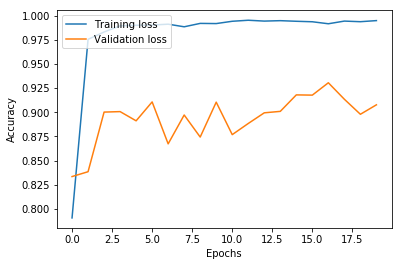

In [166]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Training loss', 'Validation loss'], loc='upper left')
plt.show()

In [167]:
import os
from pickle import load
from keras.models import load_model
os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin/'
from keras.utils.vis_utils import plot_model

plot_model(full_model, show_shapes=True, to_file='Localization.png')

# save the model
full_model.save('model.h5')

# load the model
model = load_model('model.h5') 

In [168]:
results = full_model.evaluate(X_test_re, test_y)
print('Test accuracy: ', results[1])

1111/1111 [==============================] - 0s 142us/step
Test accuracy:  0.8874887488748875


In [169]:
predicted_classes = full_model.predict(test_x)

In [170]:
print(predicted_classes.shape)

(1111, 13)


In [171]:
pred_y = np.argmax(np.round(predicted_classes),axis=1)
y = np.argmax(np.round(test_y),axis=1)
print(pred_y.shape)
print(y.shape)

(1111,)
(1111,)


In [172]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import precision_recall_fscore_support

print(classification_report(y, pred_y))
print(confusion_matrix(y, pred_y))

p, r, f1, s = precision_recall_fscore_support(y, pred_y, average='weighted')
print("Precision: " + str(p*100) + "%")
print("Recall: " + str(r*100) + "%")
print("F1-score: " + str(f1*100) + "%")

             precision    recall  f1-score   support

          0       0.87      0.95      0.91        78
          1       0.95      0.98      0.96       208
          2       0.93      0.95      0.94       165
          3       0.99      0.89      0.94        85
          4       0.78      0.70      0.74        30
          5       0.94      0.67      0.78       143
          6       0.57      0.94      0.71        87
          7       1.00      0.55      0.71        47
          8       0.95      0.83      0.89        24
          9       0.96      0.97      0.96       111
         10       0.96      0.87      0.91        54
         11       0.75      0.95      0.84        40
         12       0.89      0.79      0.84        39

avg / total       0.90      0.88      0.88      1111

[[ 74   4   0   0   0   0   0   0   0   0   0   0   0]
 [  2 204   2   0   0   0   0   0   0   0   0   0   0]
 [  3   5 156   1   0   0   0   0   0   0   0   0   0]
 [  1   2   6  76   0   0   0   0   0

In [186]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True location')
    plt.xlabel('Predicted location')

Confusion matrix, without normalization
[[ 74   4   0   0   0   0   0   0   0   0   0   0   0]
 [  2 204   2   0   0   0   0   0   0   0   0   0   0]
 [  3   5 156   1   0   0   0   0   0   0   0   0   0]
 [  1   2   6  76   0   0   0   0   0   0   0   0   0]
 [  1   0   0   0  21   5   2   0   0   0   0   1   0]
 [  3   0   0   0   5  96  39   0   0   0   0   0   0]
 [  0   0   3   0   1   1  82   0   0   0   0   0   0]
 [  1   0   0   0   0   0  20  26   0   0   0   0   0]
 [  0   0   0   0   0   0   0   0  20   4   0   0   0]
 [  0   0   0   0   0   0   0   0   1 108   2   0   0]
 [  0   0   0   0   0   0   0   0   0   0  47   5   2]
 [  0   0   0   0   0   0   0   0   0   0   0  38   2]
 [  0   0   0   0   0   0   0   0   0   1   0   7  31]]


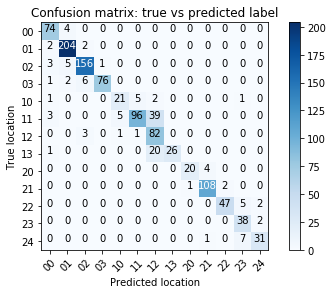

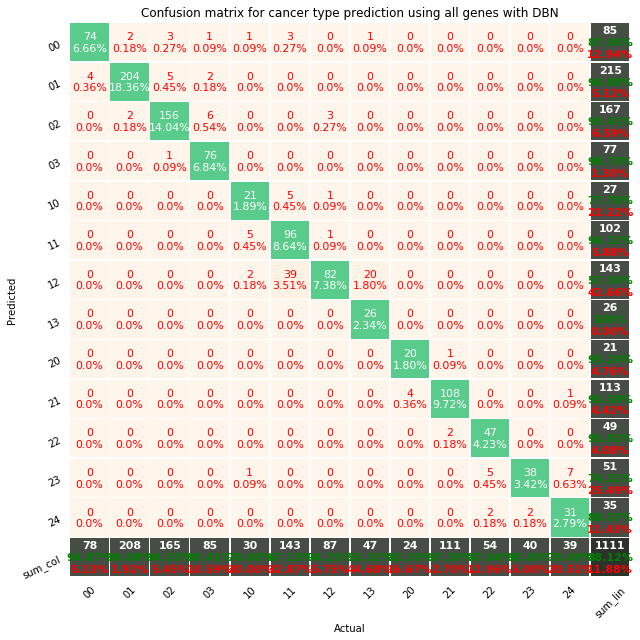

In [187]:
from confusion_matrix_pretty_print import _test_data_class
# Compute confusion matrix
cnf_matrix = confusion_matrix(y, pred_y)
np.set_printoptions(precision=2)

class_names = ['00', '01', '02', '03', '10', '11', '12', '13', '20', '21', '22', '23', '24']
# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, title='Confusion matrix: true vs predicted label')  
plt.show()

_test_data_class(y, pred_y, class_names)